In [1]:
#-----------Importing Packages---------#
# Standard imports
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import squidpy as sq
import scipy
from scipy.io import mmread
from scipy.sparse import csr_matrix
# Spatial data imports
import spatialdata as sd
import spatialdata_plot
from spatialdata import get_extent
from spatialdata import bounding_box_query
# Bin2Cell imports
import cv2
import os
import bin2cell as b2c
import seaborn as sns
from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42

/projects/b1217/Chris/condaenvs/Bin2CellEnv/lib/python3.11/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/projects/b1217/Chris/condaenvs/Bin2CellEnv/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


In [2]:
#-----------Loading TACCO Annotated Objects------------#
#Full Annotation
b2c_adata = sc.read_h5ad('/projects/b1217/HHA/EL_S2_B2C/anndatas/B2C_HE_Segmentation_Filtered_Annotated_11_13_25.h5ad')
#Matrix Subclusters
b2c_melano = sc.read_h5ad('/projects/b1217/HHA/Bulb_Spatial/HHA_B2C_TACCO_Melano_11_21_25.h5ad')

In [3]:
#--------Loading 2 um Bins----------#
#Spots
sdata = sc.read_h5ad('/projects/b1217/HHA/EL_S2_B2C/anndatas/B2C_HE_Segmentation_NoDestripe_Spot_adata_11_13_25.h5ad')
sdata

AnnData object with n_obs × n_vars = 5937327 × 17972
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts', 'destripe_factor', 'n_counts_adjusted', 'labels_he', 'labels_he_expanded'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'bin2cell', 'spatial'
    obsm: 'spatial', 'spatial_cropped_150_buffer'

In [4]:
b2c_melano.obs

,object_id,bin_count,array_row,array_col,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,...,Pericytes_Score,Proximal_CL_Score,SG_Score,SM_I_Score,SM_II_Score,Schwann_Score,T_Helper_Score,T_Reg_Score,MelanoAnnotation,Melanocytes_III_Score
192,192,25,406.240000,299.640000,433,6.073045,499.0,6.214608,23.246493,33.266533,...,0.000952,1.504684e-08,0.000002,0.002175,0.009752,0.009354,0.000845,0.000111,Melanocytes_I,0.004431
259,259,16,786.875000,912.562500,350,5.860786,396.0,5.983936,24.242424,36.868687,...,0.005673,7.974577e-07,0.107367,0.048123,0.038005,0.004059,0.043237,0.009197,Melanocytes_I,0.188620
534,534,18,162.944444,624.888889,433,6.073045,473.0,6.161207,19.027484,29.598309,...,0.007899,7.253810e-08,0.000040,0.002648,0.014569,0.013797,0.022850,0.005762,Melanocytes_I,0.014897
550,550,19,274.052632,352.789474,109,4.700480,115.0,4.753590,48.695652,92.173913,...,0.001527,2.580200e-07,0.000012,0.018684,0.060487,0.004554,0.097469,0.027828,Melanocytes_I,0.040377
974,974,21,949.428571,289.476190,371,5.918894,417.0,6.035481,23.021583,35.011990,...,0.001202,8.523436e-09,0.000009,0.001460,0.006931,0.015797,0.009530,0.003323,Melanocytes_I,0.005311
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129843,129843,15,2960.866667,2930.466667,1010,6.918695,1184.0,7.077498,13.682432,22.128378,...,0.000391,4.750440e-09,0.000032,0.000563,0.000353,0.000166,0.023622,0.013091,Melanocytes_III,0.535899
129971,129971,19,2958.421053,2913.052632,1179,7.073270,1445.0,7.276556,13.979239,20.899654,...,0.001299,1.856734e-09,0.000007,0.002765,0.001866,0.000147,0.010555,0.003819,Melanocytes_II,0.411952
130111,130111,11,2968.454545,2939.181818,389,5.966147,422.0,6.047372,19.668246,31.516588,...,0.007637,8.598051e-08,0.000060,0.030739,0.022578,0.006403,0.166440,0.083589,Melanocytes_I,0.063708
130302,130302,12,2996.916667,2886.833333,211,5.356586,235.0,5.463832,31.489362,52.765957,...,0.017757,5.931727e-07,0.000012,0.012510,0.006068,0.063715,0.039150,0.006246,Melanocytes_III,0.361264


In [5]:
#--------Mapping CellType Labels to 2 um Bins-----------#
#Getting dictionaries of TACCO mappings by ID for Melanocytes
celltype_dict = dict(zip(b2c_melano.obs["object_id"], b2c_melano.obs["MelanoAnnotation"]))
mel1prob_dict = dict(zip(b2c_melano.obs["object_id"], b2c_melano.obs["Melanocytes_I_Score"]))
mel2prob_dict = dict(zip(b2c_melano.obs["object_id"], b2c_melano.obs["Melanocytes_II_Score"]))
mel3prob_dict = dict(zip(b2c_melano.obs["object_id"], b2c_melano.obs["Melanocytes_III_Score"]))
#Mapping on to all bins based on the HE expanded segmentation
sdata.obs["MelanoAnnotation"] = sdata.obs['labels_he_expanded'].map(celltype_dict)
sdata.obs["Melanocytes_I_Score"] = sdata.obs['labels_he_expanded'].map(mel1prob_dict)
sdata.obs["Melanocytes_II_Score"] = sdata.obs['labels_he_expanded'].map(mel2prob_dict)
sdata.obs["Melanocytes_III_Score"] = sdata.obs['labels_he_expanded'].map(mel3prob_dict)
#Replacing NAs with "None" for cells that were filtered out. 
sdata.obs["MelanoAnnotation"] = sdata.obs["MelanoAnnotation"].fillna(value="None")
sdata.obs

,in_tissue,array_row,array_col,n_counts,destripe_factor,n_counts_adjusted,labels_he,labels_he_expanded,MelanoAnnotation,Melanocytes_I_Score,Melanocytes_II_Score,Melanocytes_III_Score
s_002um_00658_01498-1,1,658,1498,42.0,0.231932,33.862019,0,0,None,NaN,NaN,NaN
s_002um_02587_02503-1,1,2587,2503,13.0,0.070692,10.321063,0,0,None,NaN,NaN,NaN
s_002um_01674_00710-1,1,1674,710,69.0,0.484645,70.758116,0,0,None,NaN,NaN,NaN
s_002um_00564_00910-1,1,564,910,9.0,0.073340,10.707637,12203,12203,None,NaN,NaN,NaN
s_002um_02801_00409-1,1,2801,409,45.0,0.593537,86.656472,0,105253,None,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
s_002um_00737_02776-1,1,737,2776,3.0,0.024185,3.530980,0,0,None,NaN,NaN,NaN
s_002um_01498_01467-1,1,1498,1467,7.0,0.089888,13.123622,0,54110,None,NaN,NaN,NaN
s_002um_03248_02696-1,1,3248,2696,2.0,0.114108,16.659835,0,126525,None,NaN,NaN,NaN
s_002um_00212_00415-1,1,212,415,2.0,0.024612,3.593323,0,0,None,NaN,NaN,NaN


In [6]:
#----------Building VisiumHD Object------------#
from spatialdata_io import visium_hd
xdata = visium_hd(path = "/projects/b1217/Edward/Spatial/VisiumHD/Human/20240612EL_HuScalp_V2/outs/",
                  fullres_image_file = "/projects/b1217/Edward/Spatial/VisiumHD/Human/20240612EL_HuScalp_V2/outs/spatial/20241020_huscalp_EL_20x_tiled_HE_BWyellow.tif",
                  bin_size = [2,8]) # list like [2,8,16] if including other sizes


utils.py (429): Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
anndata.py (1758): Variable names are not unique. To make them unique, call `.var_names_make_unique`.
anndata.py (1758): Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [7]:
#--------Removing Genes/Bins without Associated Counts---------#
sc.pp.filter_genes(xdata["square_002um"], min_cells=3)
sc.pp.filter_cells(xdata["square_002um"], min_counts=1)
xdata["square_002um"]

AnnData object with n_obs × n_vars = 5937327 × 17972
    obs: 'in_tissue', 'array_row', 'array_col', 'location_id', 'region', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'

In [8]:
#---------Checking rowname equality---------#
np.array_equal(xdata["square_002um"].obs_names, sdata.obs_names) #spot data can be directly transferred over

True

In [9]:
#-------Copying over Metadata in Obs--------#
columns_to_copy = ["n_counts", "n_counts_adjusted", "labels_he_expanded", "MelanoAnnotation",
                   'Melanocytes_I_Score', 'Melanocytes_II_Score', 'Melanocytes_III_Score']
for col in columns_to_copy:
    xdata["square_002um"].obs[col] = sdata.obs[col].reindex(xdata["square_002um"].obs_names)
xdata["square_002um"].obs

,in_tissue,array_row,array_col,location_id,region,n_counts,n_counts_adjusted,labels_he_expanded,MelanoAnnotation,Melanocytes_I_Score,Melanocytes_II_Score,Melanocytes_III_Score
s_002um_00658_01498-1,1,658,1498,0,20240612EL2_square_002um,42.0,33.862019,0,None,NaN,NaN,NaN
s_002um_02587_02503-1,1,2587,2503,1,20240612EL2_square_002um,13.0,10.321063,0,None,NaN,NaN,NaN
s_002um_01674_00710-1,1,1674,710,2,20240612EL2_square_002um,69.0,70.758116,0,None,NaN,NaN,NaN
s_002um_00564_00910-1,1,564,910,3,20240612EL2_square_002um,9.0,10.707637,12203,None,NaN,NaN,NaN
s_002um_02801_00409-1,1,2801,409,4,20240612EL2_square_002um,45.0,86.656472,105253,None,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
s_002um_00737_02776-1,1,737,2776,8199855,20240612EL2_square_002um,3.0,3.530980,0,None,NaN,NaN,NaN
s_002um_01498_01467-1,1,1498,1467,8199856,20240612EL2_square_002um,7.0,13.123622,54110,None,NaN,NaN,NaN
s_002um_03248_02696-1,1,3248,2696,8199857,20240612EL2_square_002um,2.0,16.659835,126525,None,NaN,NaN,NaN
s_002um_00212_00415-1,1,212,415,8199859,20240612EL2_square_002um,2.0,3.593323,0,None,NaN,NaN,NaN


In [10]:
#---------Removing Unmapped Bins-----------#
#Filtering out unmapped bins from anndata
mask = xdata["square_002um"].obs["MelanoAnnotation"] != "None"
xdata["square_002um"] = xdata["square_002um"][mask, :]
#Filtering corresponding shapes 
subset_index = xdata.shapes['20240612EL2_square_002um'].index.intersection(xdata["square_002um"].obs["location_id"].unique())
xdata.shapes["20240612EL2_square_002um"] = xdata.shapes["20240612EL2_square_002um"].loc[subset_index]
print(xdata["square_002um"].obs)

_elements.py (125): Key `square_002um` already exists. Overwriting it in-memory.
_elements.py (105): Key `20240612EL2_square_002um` already exists. Overwriting it in-memory.


                       in_tissue  array_row  array_col  location_id  \
s_002um_01054_02737-1          1       1054       2737          175   
s_002um_01617_02598-1          1       1617       2598          490   
s_002um_02621_02422-1          1       2621       2422          751   
s_002um_00741_01842-1          1        741       1842         1009   
s_002um_01434_01597-1          1       1434       1597         1064   
...                          ...        ...        ...          ...   
s_002um_01433_01238-1          1       1433       1238      8194628   
s_002um_01307_00952-1          1       1307        952      8195252   
s_002um_02879_01825-1          1       2879       1825      8197448   
s_002um_01671_02581-1          1       1671       2581      8197464   
s_002um_00744_01840-1          1        744       1840      8199317   

                                         region  n_counts  n_counts_adjusted  \
s_002um_01054_02737-1  20240612EL2_square_002um      42.0          

In [11]:
xdata

SpatialData object
├── Images
│     ├── '20240612EL2_full_image': DataTree[cyx] (3, 20160, 20160), (3, 10080, 10080), (3, 5040, 5040), (3, 2520, 2520), (3, 1260, 1260)
│     ├── '20240612EL2_hires_image': DataArray[cyx] (3, 6000, 6000)
│     └── '20240612EL2_lowres_image': DataArray[cyx] (3, 600, 600)
├── Shapes
│     ├── '20240612EL2_square_002um': GeoDataFrame shape: (7690, 1) (2D shapes)
│     └── '20240612EL2_square_008um': GeoDataFrame shape: (519613, 1) (2D shapes)
└── Tables
      ├── 'square_002um': AnnData (7690, 17972)
      └── 'square_008um': AnnData (519613, 18085)
with coordinate systems:
    ▸ '20240612EL2', with elements:
        20240612EL2_full_image (Images), 20240612EL2_hires_image (Images), 20240612EL2_lowres_image (Images), 20240612EL2_square_002um (Shapes), 20240612EL2_square_008um (Shapes)
    ▸ '20240612EL2_downscaled_hires', with elements:
        20240612EL2_hires_image (Images), 20240612EL2_square_002um (Shapes), 20240612EL2_square_008um (Shapes)
    ▸ '2024

INFO     Rasterizing image for faster rendering.                                                                   


_elements.py (105): Key `20240612EL2_square_002um` already exists. Overwriting it in-memory.
_elements.py (125): Key `square_002um` already exists. Overwriting it in-memory.
basic.py (936): Converting copy of 'MelanoAnnotation' column to categorical dtype for categorical plotting. Consider converting before plotting.
utils.py (775): The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning


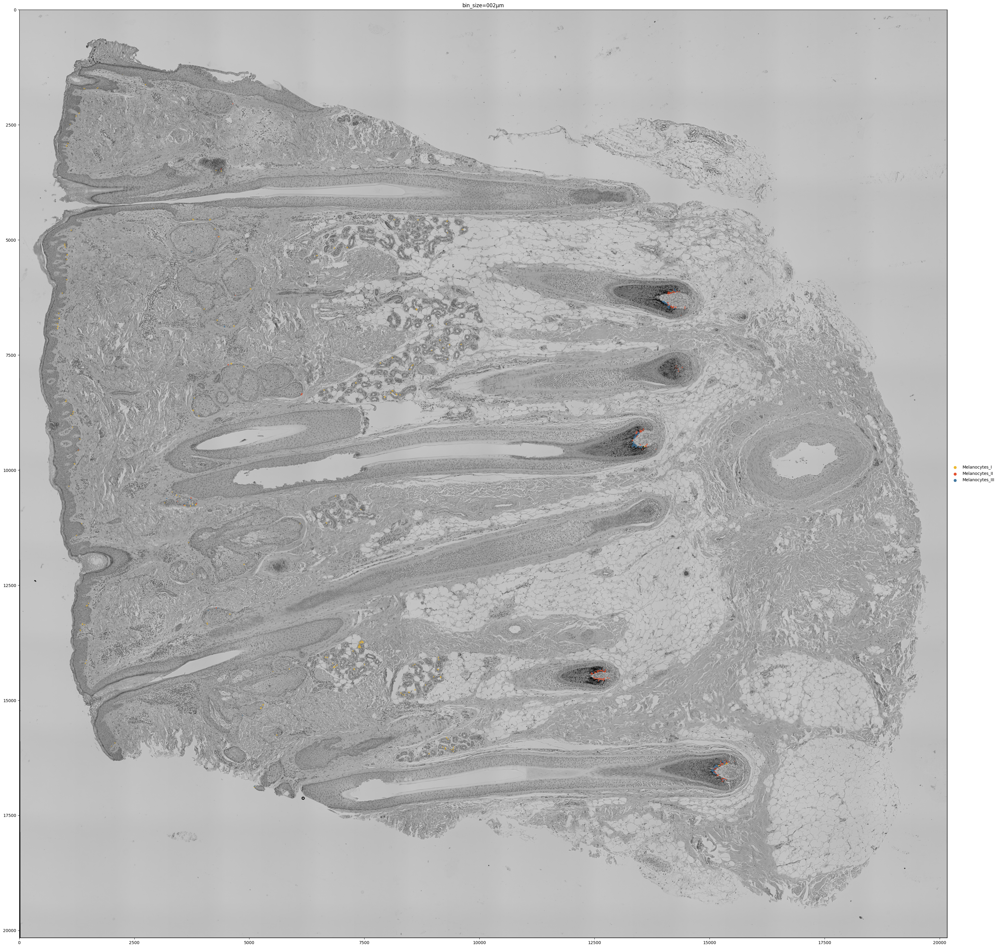

In [12]:
#------Plotting Annotations-------#
AnnotationGroups = ['Melanocytes_I', 'Melanocytes_II', 'Melanocytes_III']
AnnotationPal = ['#EDB931FF', '#E4502EFF', '#4378A0FF']
fig,ax=plt.subplots(figsize=(40, 40))
image = '20240612EL2_full_image'
shapes = '20240612EL2_square_008um'
#Plotting Clusters on Full Image
xdata.pl.render_images('20240612EL2_full_image').pl.render_shapes(
    '20240612EL2_square_002um',
    color="MelanoAnnotation",
    groups = AnnotationGroups,
    method="matplotlib", 
    palette = AnnotationPal).pl.show(
    coordinate_systems='20240612EL2', 
    title="bin_size=002µm", ax=ax,fig=fig)
#Saving as png
fig.savefig("/projects/b1217/HHA/Melanocyte_Mapping_11_21_25/",
            dpi = 600, pad_inches = 0.5, bbox_inches = "tight")